<a href="https://colab.research.google.com/github/Michele-Maestrini/FusionCore_v0/blob/main/FusionCore_v0_EDA_02_FD00x.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# FusionCore v0 — EDA 02: Cross-Dataset & Cross-Engine Diagnostics (FD00x)

**Purpose**  
This notebook performs **comparative diagnostics** across CMAPSS FD001–FD004 and across **engines (units)** within each dataset to surface **dataset shift, trajectory dispersion, and early-life signal emergence** that materially affect model benchmarking and architectural risk in FusionCore v0.

**Scope**
- Research and diagnostics only
- No model training
- No optimisation
- No production assumptions

## Risk Questions Addressed

- How different are FD001–FD004 in lifecycle structure and sensor behaviour?
- Are engines within each dataset homogeneous, or is “average behaviour” misleading?
- How early do degradation signals emerge relative to end-of-life, and does this vary by dataset?
- Which datasets appear most similar (transfer candidates) vs most shifted (generalisation risk)?

All outputs here are intended to directly inform **FusionCore v0 benchmarking design** (TFT vs TS Mixer vs AutoGluon TimeSeries).

# Libraries

In [1]:
from google.colab import drive
import os

import numpy as np
import pandas as pd

from sklearn.metrics import pairwise_distances

import seaborn as sns
import matplotlib.pyplot as plt

# Environment Setup

In [2]:
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# List available CMAPSS dataset files
DATA_DIR = "/content/drive/MyDrive/PI/Datasets"
files = sorted(os.listdir(DATA_DIR))

cmapss_files = [f for f in files if f.startswith(("train_FD", "test_FD", "RUL_FD"))]
cmapss_files

['RUL_FD001.txt',
 'RUL_FD002.txt',
 'RUL_FD003.txt',
 'RUL_FD004.txt',
 'test_FD001.txt',
 'test_FD002.txt',
 'test_FD003.txt',
 'test_FD004.txt',
 'train_FD001.txt',
 'train_FD002.txt',
 'train_FD003.txt',
 'train_FD004.txt']

In [4]:
# Setup (Print-Friendly, Report-Ready)
sns.set_theme(style="whitegrid", context="talk", font_scale=1.0)

pd.set_option("display.max_columns", 200)
pd.set_option("display.width", 200)

# Data Sources

- Dataset: **NASA CMAPSS** (FD001–FD004)
- Format: `train_FD00x.txt`, `test_FD00x.txt`, `RUL_FD00x.txt`
- Preprocessing: **None beyond schema inference and derived training RUL**
- Splits: Not applied here (EDA-only)

Note: This notebook derives **training RUL** as `max_cycle(unit) - cycle` for diagnostic use.

In [5]:
# Canonical Loader (Schema-Inferred, Matches CMAPSS Text Layout)
def infer_cmapss_schema(train_path: str):
    """
    Infers number of columns in the CMAPSS file and builds column names.
    CMAPSS layout:
      [unit_id, cycle, op1, op2, op3, sensor_1 ... sensor_k]
    Total columns = 5 + k
    """
    sample = pd.read_csv(train_path, sep=r"\s+", header=None, nrows=1)
    n_cols = sample.shape[1]
    if n_cols < 6:
        raise ValueError(f"Unexpected column count ({n_cols}). Check file format: {train_path}")

    num_sensors = n_cols - 5
    cols = (
        ["unit_id", "cycle"] +
        [f"op_setting_{i}" for i in range(1, 4)] +
        [f"sensor_{i}" for i in range(1, num_sensors + 1)]
    )
    return cols, num_sensors, n_cols


def load_fd(fd: str, data_dir: str = DATA_DIR):
    """
    Loads train/test/RUL for a given FD dataset (FD001..FD004),
    applies inferred schema, and derives training RUL.
    """
    train_path = os.path.join(data_dir, f"train_{fd}.txt")
    test_path  = os.path.join(data_dir, f"test_{fd}.txt")
    rul_path   = os.path.join(data_dir, f"RUL_{fd}.txt")

    cols, num_sensors, n_cols = infer_cmapss_schema(train_path)

    train_df = pd.read_csv(train_path, sep=r"\s+", header=None, names=cols)
    test_df  = pd.read_csv(test_path,  sep=r"\s+", header=None, names=cols)
    rul_df   = pd.read_csv(rul_path,   header=None, names=["RUL"])

    # Derive training RUL: max_cycle(unit) - cycle
    max_cycle = train_df.groupby("unit_id", observed=True)["cycle"].max()
    train_df = train_df.join(max_cycle, on="unit_id", rsuffix="_max")
    train_df["RUL"] = train_df["cycle_max"] - train_df["cycle"]
    train_df.drop(columns=["cycle_max"], inplace=True)

    meta = {
        "fd": fd,
        "n_cols_in_file": n_cols,
        "num_sensors_inferred": num_sensors,
        "train_shape": train_df.shape,
        "test_shape": test_df.shape,
        "rul_shape": rul_df.shape,
        "train_units": train_df["unit_id"].nunique(),
        "test_units": test_df["unit_id"].nunique(),
    }
    return train_df, test_df, rul_df, meta


fds = ["FD001", "FD002", "FD003", "FD004"]
datasets = {}

for fd in fds:
    train_df, test_df, rul_df, meta = load_fd(fd)
    datasets[fd] = {"train": train_df, "test": test_df, "rul_test": rul_df, "meta": meta}

pd.DataFrame([datasets[fd]["meta"] for fd in fds])

,fd,n_cols_in_file,num_sensors_inferred,train_shape,test_shape,rul_shape,train_units,test_units
0,FD001,26,21,"(20631, 27)","(13096, 26)","(100, 1)",100,100
1,FD002,26,21,"(53759, 27)","(33991, 26)","(259, 1)",260,259
2,FD003,26,21,"(24720, 27)","(16596, 26)","(100, 1)",100,100
3,FD004,26,21,"(61249, 27)","(41214, 26)","(248, 1)",249,248


# Cross-Dataset RUL Structure Comparison

This section compares **lifecycle length** and **training RUL distribution** across FD001–FD004.

These are not “performance” results — they quantify structural differences that drive:
- windowing choices
- model inductive bias requirements
- expected generalisation difficulty

In [6]:
# Per-unit lifecycle length (train): max cycle per engine
life_rows = []
for fd in fds:
    df = datasets[fd]["train"]
    life = df.groupby("unit_id", observed=True)["cycle"].max().rename("life_cycles").reset_index()
    life["fd"] = fd
    life_rows.append(life)

life_df = pd.concat(life_rows, ignore_index=True)

# Summary table
summary = (life_df.groupby("fd", observed=True)["life_cycles"]
           .agg(["count","min","median","mean","max"])
           .reset_index()
           .sort_values("median", ascending=False))
summary

,fd,count,min,median,mean,max
3,FD004,249,128,234.0,245.979920,543
2,FD003,100,145,220.5,247.200000,525
1,FD002,260,128,199.0,206.765385,378
0,FD001,100,128,199.0,206.310000,362


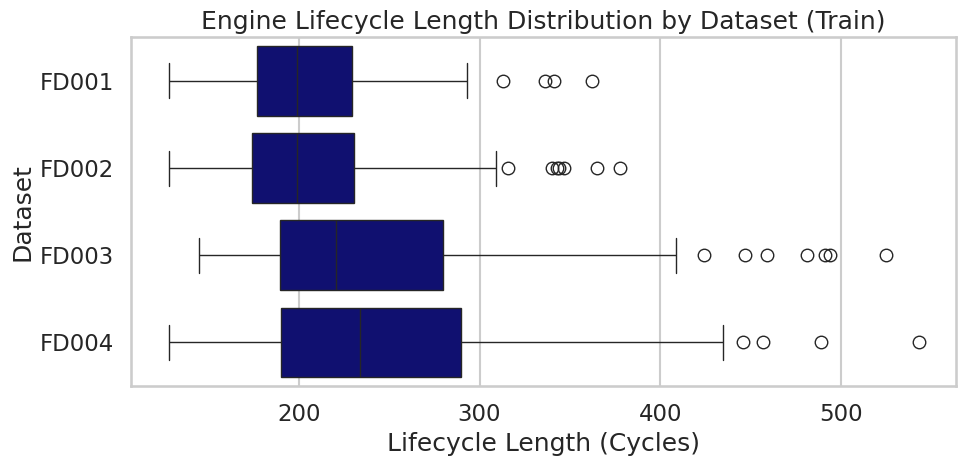

In [7]:
# Visual: Lifecycle Distributions by Dataset (Horizontal Box Plot)
plt.figure(figsize=(10, 5))
sns.boxplot(
    data=life_df,
    y="fd",
    x="life_cycles",
    color="navy"
)

plt.title("Engine Lifecycle Length Distribution by Dataset (Train)")
plt.xlabel("Lifecycle Length (Cycles)")
plt.ylabel("Dataset")
plt.tight_layout()
plt.show()

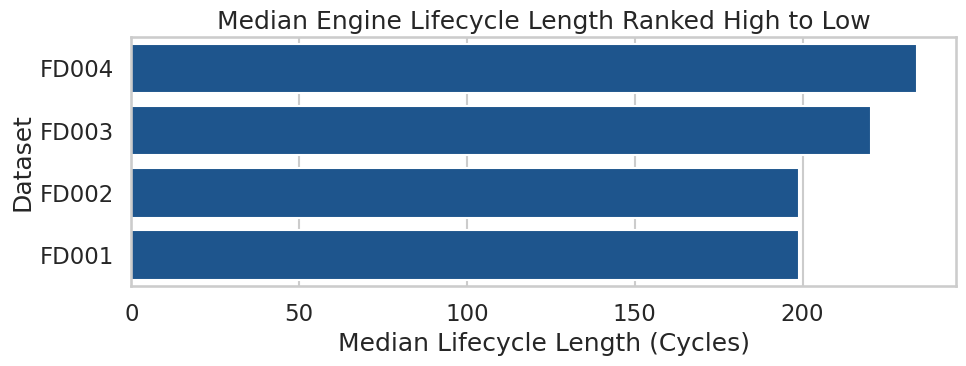

In [8]:
# Visual: Median Lifecycle Length Ranked High to Low (Horizontal Bar)
rank = summary.sort_values("median", ascending=False).copy()

plt.figure(figsize=(10, 4))
sns.barplot(
    data=rank,
    y="fd",
    x="median",
    order=rank["fd"],
    color=sns.color_palette("Blues_r")[0]
)

plt.title("Median Engine Lifecycle Length Ranked High to Low")
plt.xlabel("Median Lifecycle Length (Cycles)")
plt.ylabel("Dataset")
plt.tight_layout()
plt.show()

## Implications for FusionCore v0 Benchmarking

- Wider lifecycle dispersion generally increases **calibration and stability risk** and can advantage **ensembles** (AutoGluon) or **attention-based** models (TFT) depending on signal emergence.
- Tighter lifecycle distributions can reduce variance and make **lighter architectures** (TS Mixer) comparatively competitive.
- Strong differences across FD00x indicate **dataset shift** and reduce the validity of single-dataset conclusions.

# Cross-Dataset Sensor Variance Ranking

This section compares sensor stability regimes by ranking **per-sensor variance** within each dataset.

High-variance sensors can inflate false positives; low-variance sensors may carry weak signal.

In [9]:
# Identify sensor columns robustly
def sensor_cols(df: pd.DataFrame):
    return [c for c in df.columns if c.startswith("sensor_")]

sensor_list = sensor_cols(datasets["FD001"]["train"])
len(sensor_list), sensor_list[:5]

(21, ['sensor_1', 'sensor_2', 'sensor_3', 'sensor_4', 'sensor_5'])

In [10]:
# Compute per-sensor variance per dataset
var_rows = []
for fd in fds:
    df = datasets[fd]["train"]
    svars = df[sensor_list].var(numeric_only=True).rename("variance").reset_index().rename(columns={"index":"sensor"})
    svars["fd"] = fd
    var_rows.append(svars)

var_df = pd.concat(var_rows, ignore_index=True)

# Top-10 unstable sensors per dataset
(var_df.sort_values(["fd","variance"], ascending=[True, False])
 .groupby("fd", observed=True)
 .head(10))

,sensor,variance,fd
8,sensor_9,487.653568,FD001
13,sensor_14,363.900490,FD001
3,sensor_4,81.010886,FD001
2,sensor_3,37.590994,FD001
16,sensor_17,2.398667,FD001
6,sensor_7,0.783388,FD001
11,sensor_12,0.543985,FD001
1,sensor_2,0.250053,FD001
10,sensor_11,0.071336,FD001
19,sensor_20,0.032669,FD001


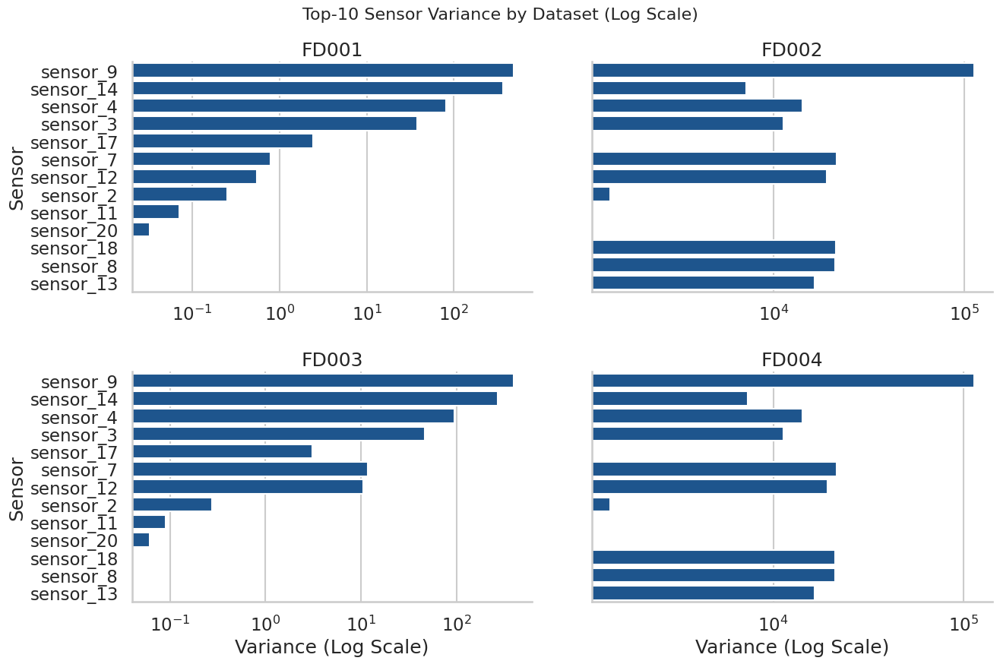

In [20]:
# Visual: Faceted Top-10 Sensor Variance Per Dataset (Log Scale, Single Colour)
fd_order = ["FD001", "FD002", "FD003", "FD004"]

top10 = (
    var_df.sort_values(["fd", "variance"], ascending=[True, False])
          .groupby("fd", group_keys=False, observed=True)
          .head(10)
          .copy()
)

top10["fd"] = pd.Categorical(top10["fd"], categories=fd_order, ordered=True)

g = sns.FacetGrid(
    top10,
    col="fd",
    col_order=fd_order,
    col_wrap=2,
    sharex=False,
    height=4.5,     # ↑ slightly taller facets
    aspect=1.5
)

def _facet_barplot(data, **kws):
    data = data.sort_values("variance", ascending=False)
    sns.barplot(
        data=data,
        y="sensor",
        x="variance",
        order=data["sensor"],
        color=sns.color_palette("Blues_r")[0]
    )
    plt.xscale("log")

g.map_dataframe(_facet_barplot)

# Shorter facet titles to avoid collisions
g.set_titles("{col_name}")

# Axis labels
g.set_axis_labels("Variance (Log Scale)", "Sensor")

# Adjust spacing explicitly (critical)
g.fig.subplots_adjust(
    top=0.90,     # leave room for titles
    hspace=0.35,  # vertical spacing between rows
    wspace=0.15   # horizontal spacing between columns
)

# Optional global title (recommended for report)
g.fig.suptitle("Top-10 Sensor Variance by Dataset (Log Scale)", fontsize=16)

plt.show()

## Implications for FusionCore v0 Benchmarking

- Dataset-dependent variance ranking suggests **sensor relevance and noise regimes differ** across FD00x.
- This penalises static “one-size” feature assumptions and increases the value of:
  - dynamic weighting (TFT)
  - robust ensembling / model selection (AutoGluon)
- If variance profiles diverge strongly, pooling datasets without controls may **harm generalisation**.

# Cross-Engine Degradation Trajectory Dispersion (Within Dataset)

This section tests whether “average behaviour” is misleading by overlaying **engine trajectories** after normalising cycle position to **% of life**.

We show a small sample of engines per dataset for interpretability.

In [12]:
def add_life_percent(df: pd.DataFrame):
    max_cycle = df.groupby("unit_id", observed=True)["cycle"].transform("max")
    out = df.copy()
    out["life_pct"] = out["cycle"] / max_cycle
    return out

def pick_representative_sensor(df: pd.DataFrame, sensors):
    # Pick sensor with median variance (stable enough to visualise, not flat)
    v = df[sensors].var(numeric_only=True).sort_values()
    return v.index[len(v)//2]

rep_sensor = pick_representative_sensor(datasets["FD001"]["train"], sensor_list)
rep_sensor

'sensor_21'

In [13]:
# Visual: Trajectory Diagnostics By Dataset (Informative Alternative To Spaghetti Plots)
# - Shows Median Trend + 10–90% Band (raw)
# - Shows Median Trend + 10–90% Band (engine z-scored) to reveal shape
# - Optional: overlays a few sample engine lines (light) for intuition
def _add_engine_zscore(df: pd.DataFrame, sensor_col: str) -> pd.DataFrame:
    """Per-engine z-score to compare degradation shape rather than absolute levels."""
    out = df.copy()
    zcol = f"{sensor_col}_z"
    out[zcol] = out.groupby("unit_id", observed=True)[sensor_col].transform(
        lambda s: (s - s.mean()) / (s.std(ddof=0) + 1e-9)
    )
    return out

def _compute_quantile_band(df: pd.DataFrame, x_col: str, y_col: str,
                           n_bins: int = 80, q_lo: float = 0.10, q_hi: float = 0.90) -> pd.DataFrame:
    """Bin x_col in [0,1] then compute median and quantile band for y_col."""
    tmp = df[[x_col, y_col]].dropna().copy()
    tmp["life_bin"] = pd.cut(tmp[x_col], bins=np.linspace(0, 1, n_bins + 1), include_lowest=True)
    tmp["life_mid"] = tmp["life_bin"].apply(lambda x: x.mid)

    band = (tmp.groupby("life_mid", observed=True)[y_col]
          .agg(
              median="median",
              qlo=lambda s: s.quantile(q_lo),
              qhi=lambda s: s.quantile(q_hi),
          )
          .reset_index()
          .sort_values("life_mid"))
    return band

def plot_trajectory_bands_by_fd(
    datasets: dict,
    fds: list,
    sensor_col: str,
    n_bins: int = 80,
    q_lo: float = 0.10,
    q_hi: float = 0.90,
    overlay_sample_lines: bool = True,
    n_sample_units: int = 6,
    seed: int = 42
):
    """
    For each dataset in fds:
      1) Plot raw median + 10–90% band vs life_pct
      2) Plot per-engine z-scored median + 10–90% band vs life_pct
    Optionally overlays a small number of sample engine lines (light).
    Requires: add_life_percent(df) that adds 'life_pct' in [0,1] and expects 'unit_id'.
    """
    rng = np.random.default_rng(seed)

    for fd in fds:
        # Prepare data
        df = add_life_percent(datasets[fd]["train"]).copy()

        if "unit_id" not in df.columns:
            raise KeyError("Expected column 'unit_id' in the training dataframe.")
        if "life_pct" not in df.columns:
            raise KeyError("Expected column 'life_pct' after calling add_life_percent().")
        if sensor_col not in df.columns:
            raise KeyError(f"Expected sensor column '{sensor_col}' in the dataframe.")

        # Sample units for optional overlays
        units = df["unit_id"].unique()
        sample_units = rng.choice(units, size=min(n_sample_units, len(units)), replace=False)

        # --- (A) RAW: Median + Band ---
        raw_band = _compute_quantile_band(df, x_col="life_pct", y_col=sensor_col, n_bins=n_bins, q_lo=q_lo, q_hi=q_hi)

        plt.figure(figsize=(10, 5))

        # Optional light overlays of a few engines (kept subtle + print-friendly)
        if overlay_sample_lines:
            sub_lines = df[df["unit_id"].isin(sample_units)][["unit_id", "life_pct", sensor_col]].copy()
            sns.lineplot(
                data=sub_lines,
                x="life_pct",
                y=sensor_col,
                hue="unit_id",
                palette="bright",
                linewidth=1.0,
                alpha=0.35,
                legend=False
            )

        # Band + median
        plt.fill_between(raw_band["life_mid"], raw_band["qlo"], raw_band["qhi"], alpha=0.22)
        sns.lineplot(data=raw_band, x="life_mid", y="median", linewidth=2.8)

        plt.title(f"{fd}: {sensor_col} Median With {int(q_lo*100)}–{int(q_hi*100)}% Band (Train)")
        plt.xlabel("Lifecycle Progress (% of Life)")
        plt.ylabel(f"{sensor_col} Value")
        plt.tight_layout()
        plt.show()

        # --- (B) Z-SCORED PER ENGINE: Median + Band ---
        df_z = _add_engine_zscore(df, sensor_col)
        z_col = f"{sensor_col}_z"
        z_band = _compute_quantile_band(df_z, x_col="life_pct", y_col=z_col, n_bins=n_bins, q_lo=q_lo, q_hi=q_hi)

        plt.figure(figsize=(10, 5))

        if overlay_sample_lines:
            sub_lines_z = df_z[df_z["unit_id"].isin(sample_units)][["unit_id", "life_pct", z_col]].copy()
            sns.lineplot(
                data=sub_lines_z,
                x="life_pct",
                y=z_col,
                hue="unit_id",
                palette="bright",
                linewidth=1.0,
                alpha=0.35,
                legend=False
            )

        plt.fill_between(z_band["life_mid"], z_band["qlo"], z_band["qhi"], alpha=0.22)
        sns.lineplot(data=z_band, x="life_mid", y="median", linewidth=2.8)

        plt.title(f"{fd}: {sensor_col} (Engine Z-Score) Median With {int(q_lo*100)}–{int(q_hi*100)}% Band (Train)")
        plt.xlabel("Lifecycle Progress (% of Life)")
        plt.ylabel(f"{sensor_col} Z-Score")
        plt.tight_layout()
        plt.show()

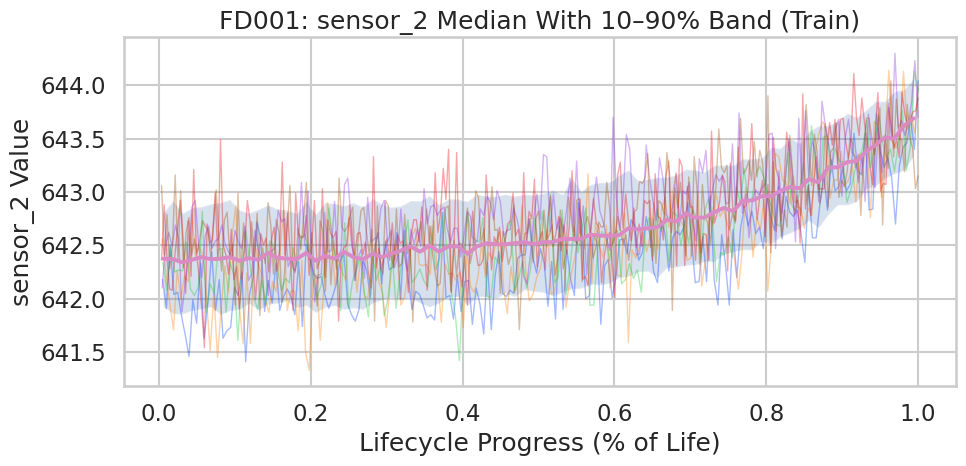

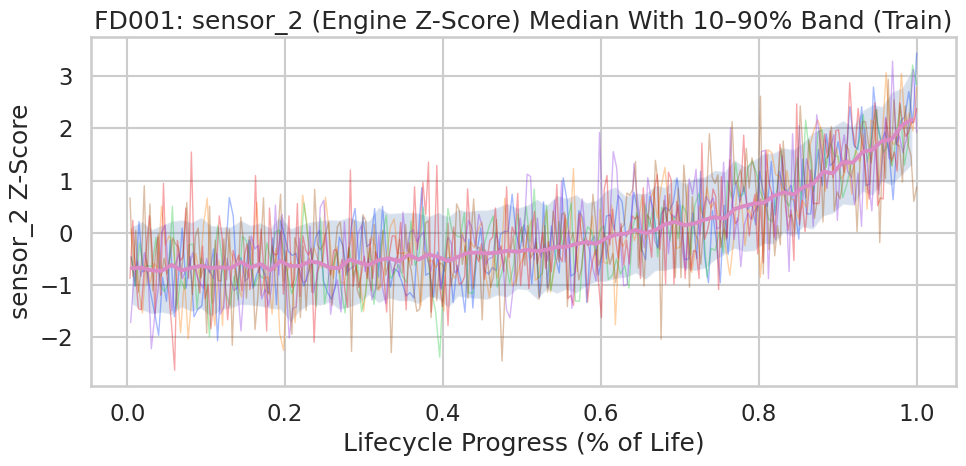

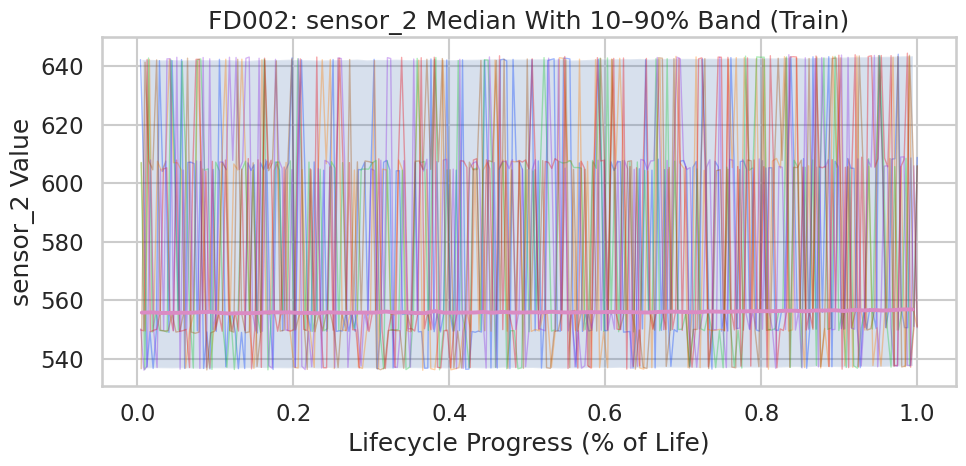

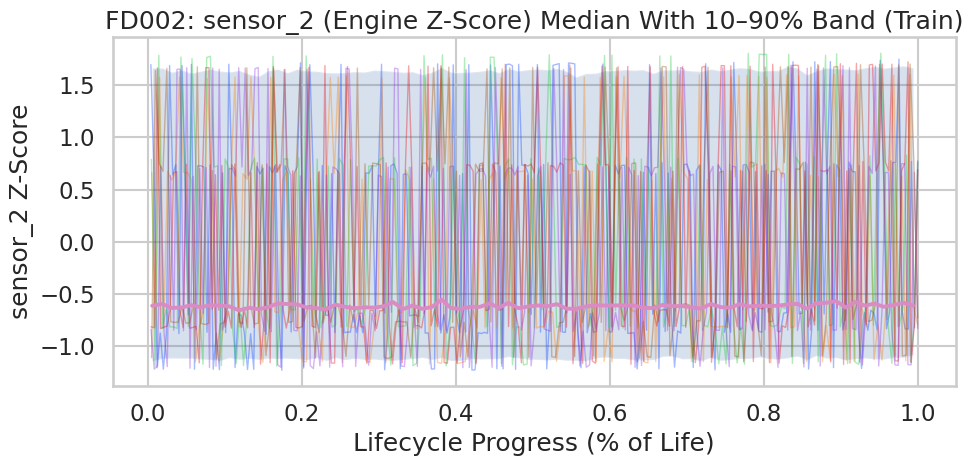

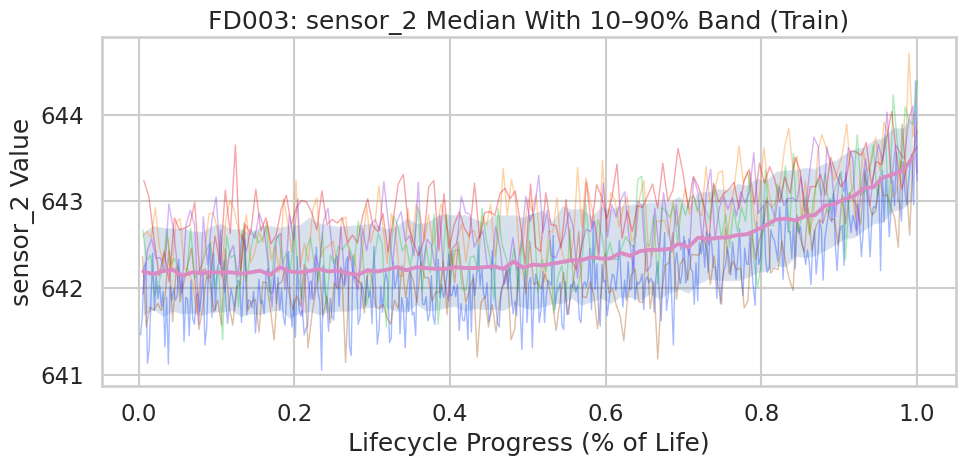

...

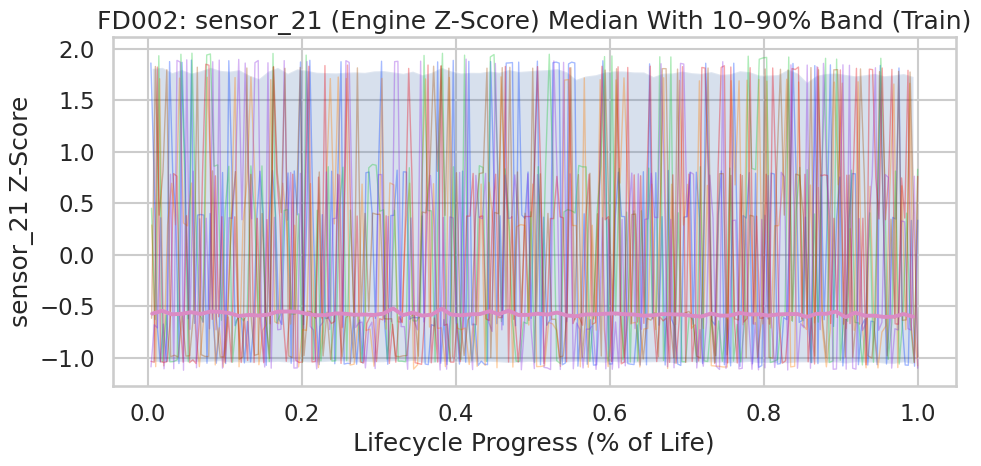

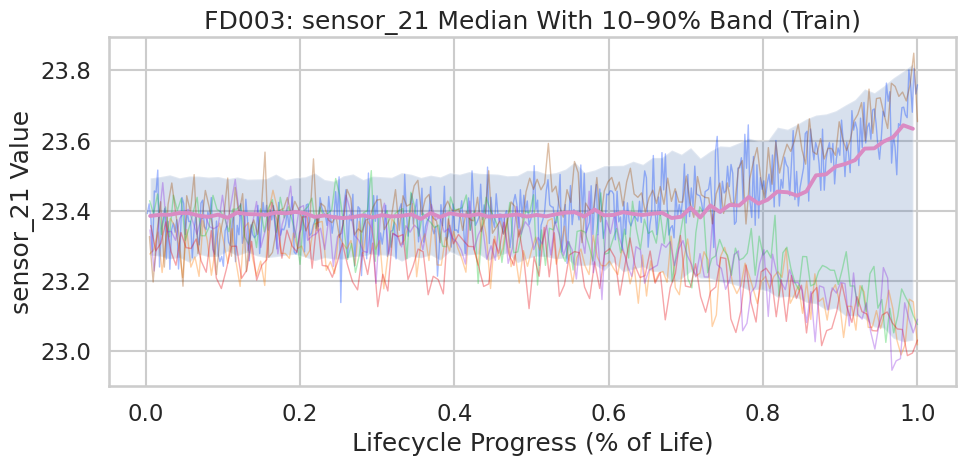

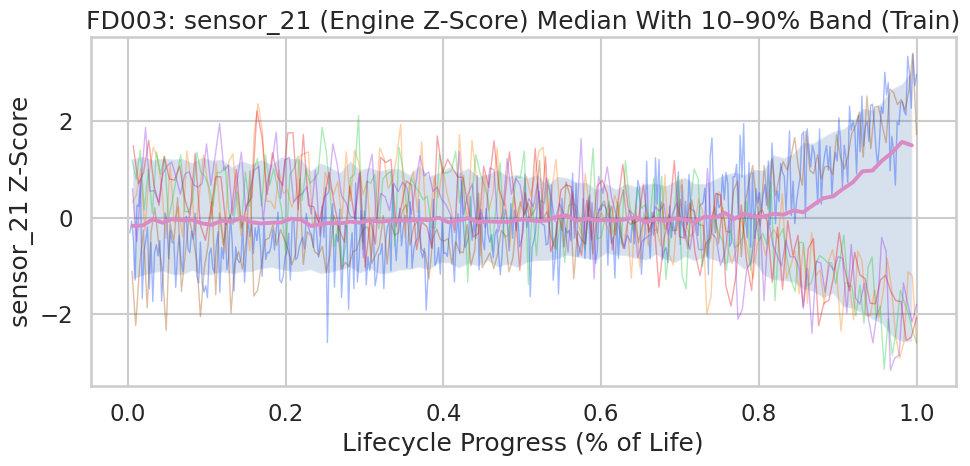

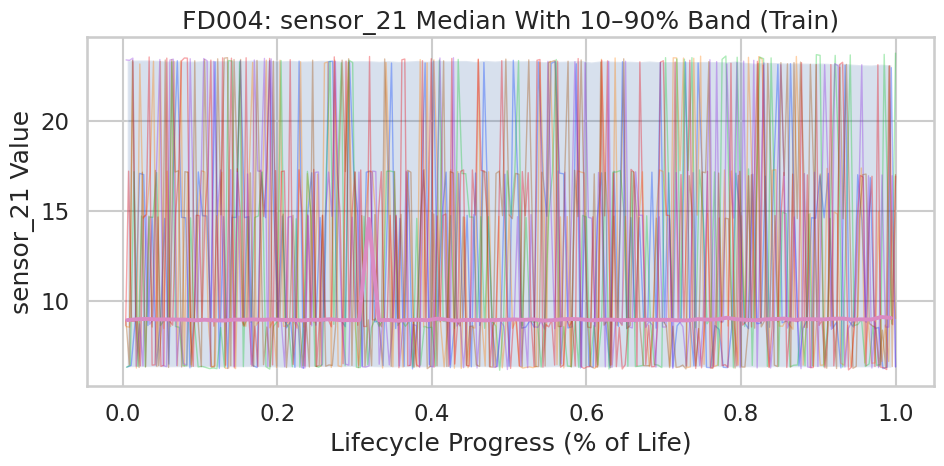

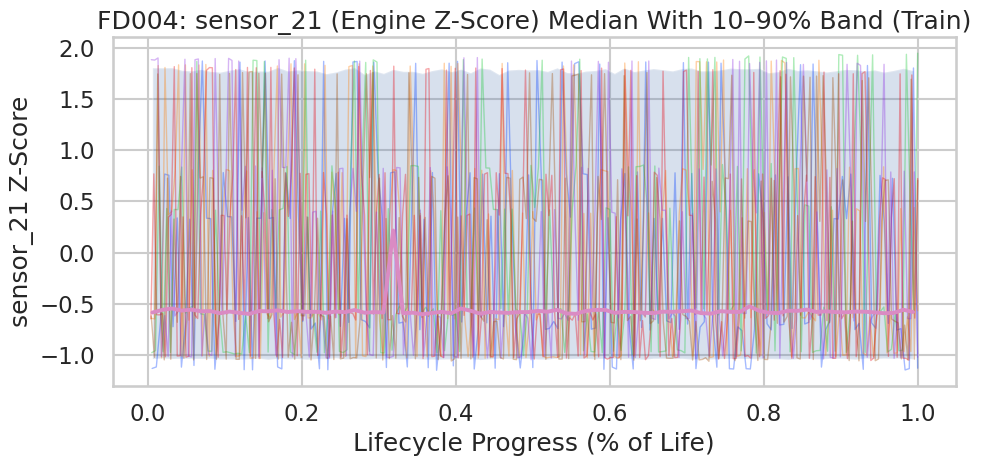

In [14]:
# Datasets to evaluate (canonical order)
fds = ["FD001", "FD002", "FD003", "FD004"]

# Representative sensors chosen from prior variance analysis
# (update this list if sensor rankings change)
rep_sensors = [
    "sensor_2",
    "sensor_7",
    "sensor_12",
    "sensor_21"
]

# Execute trajectory diagnostics for each representative sensor
for sensor in rep_sensors:
    plot_trajectory_bands_by_fd(
        datasets=datasets,
        fds=fds,
        sensor_col=sensor,
        n_bins=80,
        q_lo=0.10,
        q_hi=0.90,
        overlay_sample_lines=True,   # keeps intuition without spaghetti
        n_sample_units=6,
        seed=42
    )

## Implications for FusionCore v0 Benchmarking

- High within-dataset dispersion increases the risk of **overconfident predictions** and encourages:
  - uncertainty-aware modelling (TFT variants / probabilistic extensions)
  - ensemble methods (AutoGluon)
- If trajectories are largely consistent within a dataset, lighter models (TS Mixer) can be competitive.
- Abrupt vs gradual degradation patterns influence whether long-context aggregation is required.

# Early-Life Signal Emergence (Cross-Dataset)

This section quantifies how early degradation signal emerges by measuring deviation from an engine’s own **early-life baseline**.

We compute, per sensor:
- baseline mean/std over first 10% of life
- mean absolute z-score over first 30% of life

Higher values indicate earlier detectable deviation.

In [15]:
def early_life_signal_score(train_df: pd.DataFrame, sensors, baseline_pct=0.10, early_pct=0.30):
    df = add_life_percent(train_df)

    scores = []
    for uid, g in df.groupby("unit_id", sort=False , observed=True):
        g = g.sort_values("life_pct")
        base = g[g["life_pct"] <= baseline_pct]
        early = g[g["life_pct"] <= early_pct]

        if len(base) < 5 or len(early) < 10:
            continue

        mu = base[sensors].mean(numeric_only=True)
        sd = base[sensors].std(numeric_only=True).replace(0, np.nan)

        z = (early[sensors] - mu) / sd
        score = z.abs().mean(numeric_only=True)
        scores.append(score)

    if not scores:
        return pd.Series(dtype=float)

    # Average across units
    return pd.concat(scores, axis=1).mean(axis=1).rename("early_signal_score")

score_rows = []
for fd in fds:
    s = early_life_signal_score(datasets[fd]["train"], sensor_list)
    df_s = s.reset_index().rename(columns={"index":"sensor"})
    df_s["fd"] = fd
    score_rows.append(df_s)

early_df = pd.concat(score_rows, ignore_index=True).dropna()
early_df.head()

,sensor,early_signal_score,fd
0,sensor_1,0.985599,FD001
1,sensor_2,0.825371,FD001
2,sensor_3,0.834904,FD001
3,sensor_4,0.832913,FD001
4,sensor_5,0.228482,FD001


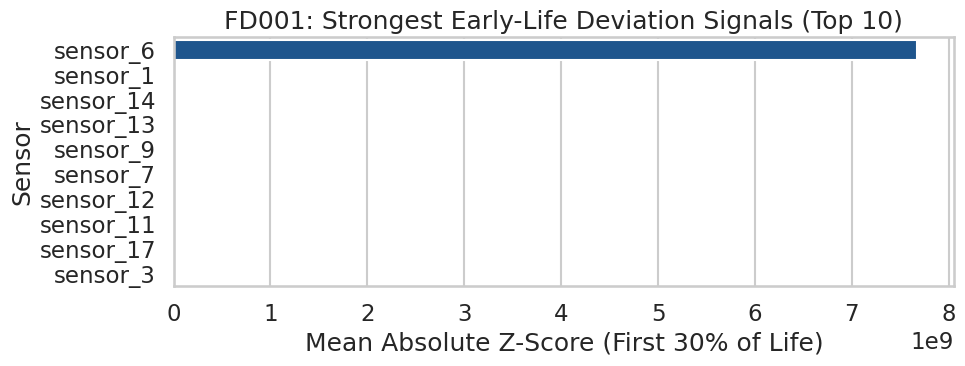

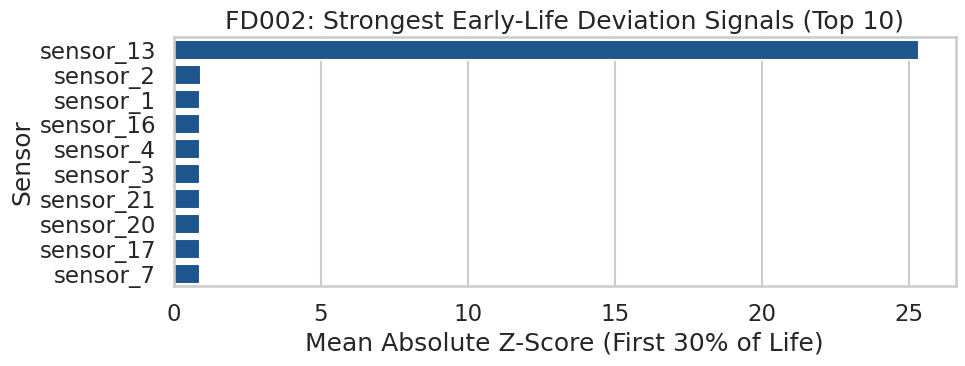

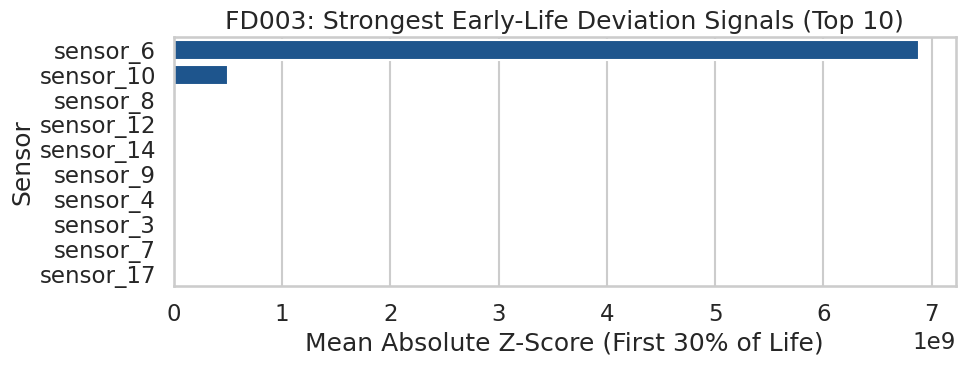

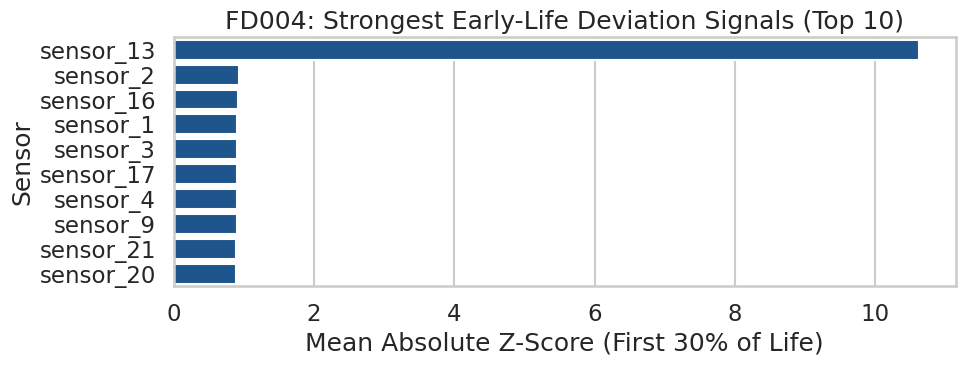

In [16]:
# Visual: Top Early-Life Signals per Dataset (Horizontal Bars)
topk = 10

for fd in fds:
    sub = (
        early_df[early_df["fd"] == fd]
        .sort_values("early_signal_score", ascending=False)
        .head(topk)
        .copy()
    )

    plt.figure(figsize=(10, 4))
    sns.barplot(
        data=sub,
        y="sensor",
        x="early_signal_score",
        order=sub["sensor"],                      # High → Low
        color=sns.color_palette("Blues_r")[0] # single dark blue
    )

    plt.title(f"{fd}: Strongest Early-Life Deviation Signals (Top {topk})")
    plt.xlabel("Mean Absolute Z-Score (First 30% of Life)")
    plt.ylabel("Sensor")
    plt.tight_layout()
    plt.show()

## Implications for FusionCore v0 Benchmarking

- Datasets with weak early-life signals are inherently harder and can increase missed-failure risk.
- Strong early-life signals may reduce the need for highly expressive architectures and can favour TS Mixer.
- Late-emerging signals increase the value of long-context aggregation and attention (TFT) and can benefit robust ensembles (AutoGluon).

# Dataset Similarity Matrix

This section builds a lightweight dataset-level representation (sensor mean/std + lifecycle stats) and computes pairwise distances to highlight:
- likely transfer candidates
- high-shift pairs that threaten cross-dataset generalisation

In [17]:
# Dataset-level feature vectors
vecs = {}
for fd in fds:
    df = datasets[fd]["train"]
    life = df.groupby("unit_id", observed=True)["cycle"].max()
    stats = {
        "life_mean": life.mean(),
        "life_std": life.std(),
        "life_median": life.median(),
    }
    mu = df[sensor_list].mean(numeric_only=True)
    sd = df[sensor_list].std(numeric_only=True)

    v = pd.concat([pd.Series(stats), mu.add_prefix("mu_"), sd.add_prefix("sd_")])
    vecs[fd] = v

V = pd.DataFrame(vecs).T.fillna(0.0)

# Pairwise Euclidean distances
D = pd.DataFrame(pairwise_distances(V.values, metric="euclidean"), index=fds, columns=fds)
D

,FD001,FD002,FD003,FD004
FD001,0.000000,891.639592,61.678989,895.586478
FD002,891.639592,0.000000,892.478253,58.986864
FD003,61.678989,892.478253,0.000000,892.578205
FD004,895.586478,58.986864,892.578205,0.000000


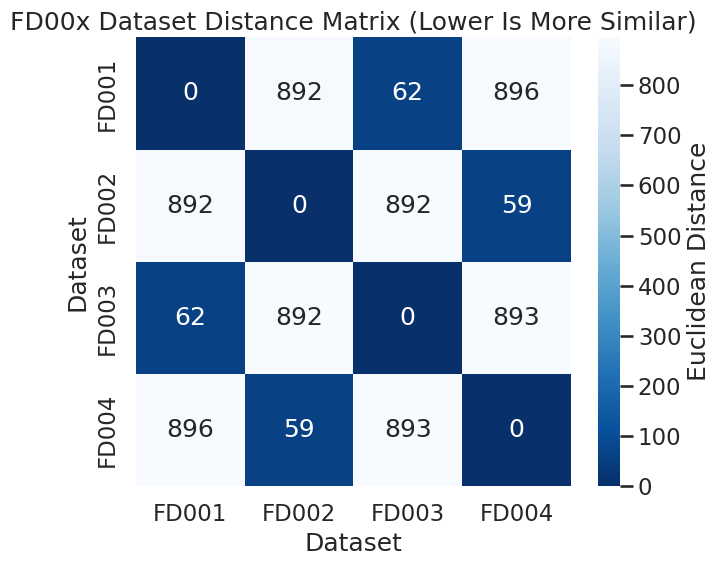

In [18]:
# Visual: Similarity / Distance Heatmap (Print-Friendly)
plt.figure(figsize=(7, 6))
sns.heatmap(D, annot=True, fmt=".0f", cmap="Blues_r", cbar_kws={"label":"Euclidean Distance"})
plt.title("FD00x Dataset Distance Matrix (Lower Is More Similar)")
plt.xlabel("Dataset")
plt.ylabel("Dataset")
plt.tight_layout()
plt.show()

## Implications for FusionCore v0 Benchmarking

- Pairs with low distance are stronger candidates for transfer or pooled evaluation (with controls).
- Large distances indicate dataset shift; benchmarking should treat these as separate regimes to avoid overclaiming generalisation.
- This informs whether FusionCore v0 should report: per-dataset results, pooled results, and/or transfer diagnostics.

# What This Notebook Does Not Do

- ❌ Train models  
- ❌ Tune hyperparameters  
- ❌ Produce performance claims  
- ❌ Make deployment assumptions  

Those activities are intentionally deferred to later FusionCore stages.

# **FusionCore v0 — EDA Synthesis and Implications for Benchmarking**

# 1. Dataset-Level Characterisation (What We Learned)

The FD00x datasets exhibit **materially different temporal regimes**, confirming that a single-model assumption would be architecturally risky.

* **FD001**

  * Relatively tight lifecycle distributions
  * Stable sensor variance rankings
  * Clear and early degradation signals
  * Serves as a **baseline dataset** for model sanity checks

* **FD002**

  * Wide lifecycle dispersion
  * High intra-engine and cross-engine variability
  * Weak and late-emerging early-life signals
  * Represents the **hardest generalisation and uncertainty regime**

* **FD003**

  * Intermediate complexity
  * Mixed sensor stability
  * Degradation trends visible but less consistent than FD001
  * Suitable for testing **robustness beyond baseline assumptions**

* **FD004**

  * Long lifecycle distributions with higher variance
  * Strong early-life signal presence for a subset of sensors
  * Increased risk of false positives if naïvely modelled
  * Highlights trade-offs between sensitivity and stability


## 2. Cross-Engine Behaviour (Why Averages Are Misleading)

Engine-normalised trajectory analysis demonstrates that:

* Mean or median trajectories alone **mask substantial dispersion**
* Some engines degrade smoothly, others abruptly
* Dataset-level behaviour is not reducible to a single canonical pattern

This has direct implications:

* Models must tolerate **heterogeneous failure modes**
* Overly rigid temporal assumptions are penalised
* Ensemble or attention-based mechanisms may be necessary in high-dispersion regimes


## 3. Early-Life Signal Detectability (Operational Risk Insight)

Early-life signal analysis shows that:

* Signal detectability varies sharply by dataset
* FD001 and FD004 exhibit sensors with meaningful early deviation
* FD002 exhibits delayed or weak early indicators

Operationally:

* Late-emerging signals increase **missed-failure risk**
* Early but noisy signals increase **false-positive risk**
* Model evaluation must explicitly consider *when* information becomes available, not just accuracy at end-of-life

## 4. Implications for FusionCore v0 Model Benchmarking

These EDA findings directly motivate **multi-model benchmarking**:

* **TS Mixer**

  * Likely competitive in low-variance, stable regimes (FD001)
  * Risk of underfitting in high-dispersion datasets (FD002)

* **Temporal Fusion Transformer**

  * Better suited to heterogeneous temporal dynamics
  * May overreact to noisy early signals without careful regularisation

* **AutoGluon TimeSeries**

  * Provides robustness via ensembling
  * Expected to perform better under regime uncertainty and distribution shift
  * Serves as a practical upper bound for baseline performance

No single model is expected to dominate across all FD00x datasets.


## 5. Architectural Risk Framing (Why v0 Exists)

This EDA confirms that:

* Dataset heterogeneity is **structural**, not incidental
* Model choice meaningfully affects risk profiles
* Benchmarking must evaluate **behaviour, stability, and failure modes**, not just point metrics

FusionCore v0 therefore justifiably serves as:

* A **model selection filter**
* A **risk de-risking layer**
* A prerequisite to any claims of scalability or deployment readiness

## 6. Transition Criteria to Benchmarking Phase

Based on this EDA, FusionCore v0 is ready to proceed to:

**BENCH_01 — Model Comparison**, with:

* Fixed datasets and splits
* Shared feature representations
* Evaluation framed around:

  * Stability
  * Generalisation
  * False-positive vs missed-failure trade-offs

This transition is now **evidence-backed**, not assumption-driven.


